# **Color palette clustering: Resnet50 + KMeans**



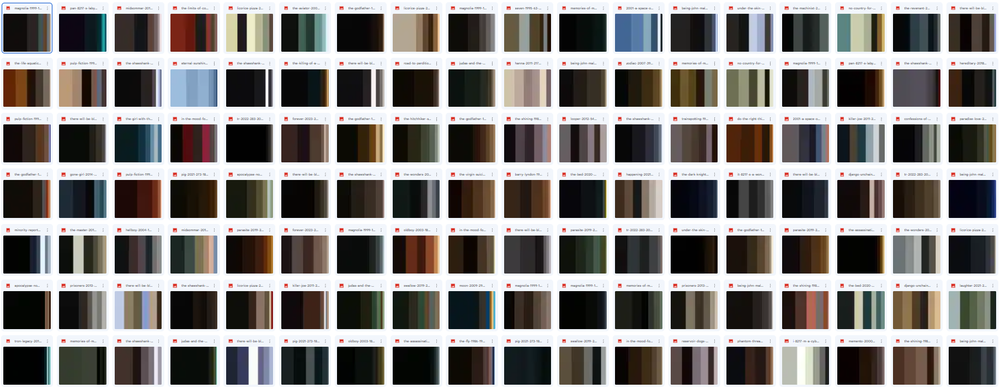

In this notebook we've performed the final and third task of the project: Clustering based on color palette. We used KMeans to extract the color palette from the shots and save the images of the palette in a dedicated folder on the drive. Then we extracted the features with ResNet50 and used those features for the final clustering. We performed KMeans tuning on this final clustering with elbow method and silhouette score.

# **0. Spark + Google Colab Setup**

In [ ]:
JAVA_HOME = "/usr/lib/jvm/java-8-openjdk-amd64"
GDRIVE_DIR = "/content/drive"
GDRIVE_HOME_DIR = GDRIVE_DIR + "<path>"
GDRIVE_DATA_DIR = GDRIVE_HOME_DIR + "<path>"
GDRIVE_DATA_CSV = GDRIVE_HOME_DIR + "<path>"
RANDOM_SEED = 42

import os
os.environ["JAVA_HOME"] = JAVA_HOME

Here we got some useful libraries we've used throughout the notebook

In [ ]:
import matplotlib.pyplot as plt
from PIL import ImageFilter
import PIL.Image as Image
import pandas as pd
import numpy as np
import cv2
import io

In [ ]:
# Point Colaboratory to our Google Drive
from google.colab import drive
drive.mount(GDRIVE_DIR, force_remount=True)

Mounted at /content/drive


## **0.1.** Install PySpark and related dependencies

In [ ]:
!pip install pyspark
!apt install openjdk-8-jdk-headless -qq

import pyspark
from pyspark.sql import *
from pyspark.sql.types import *
from pyspark.sql.functions import *
from pyspark import SparkContext, SparkConf
from pyspark.serializers import PickleSerializer

In [ ]:
# Create the session
conf = SparkConf().\
                set('spark.ui.port', "4050").\
                set('spark.executor.memory', '4G').\
                set('spark.driver.memory', '45G').\
                set('spark.driver.maxResultSize', '10G').\
                setAppName("PySparkTutorial").\
                setMaster("local[*]")

# Create the context
sc = pyspark.SparkContext(conf=conf)
spark = SparkSession.builder.getOrCreate()

# **1. Useful imports**

In [ ]:
import tensorflow as tf
import imutils
from os import listdir
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input

In [ ]:
from pyspark.sql.functions import col, udf, pandas_udf, PandasUDFType
from pyspark.sql.types import StringType, IntegerType
from pyspark.ml.linalg import VectorUDT, Vectors

# **2. Feature Extraction with Resnet50 from 50x50 palette images**


### ResNet-50 is a convolutional neural network architecture with 50 layers. It utilizes residual blocks with skip connections to address the vanishing gradient problem. The architecture includes convolutional layers for feature extraction, pooling layers for spatial dimension reduction, and fully connected layers for classification. Its architecture is shown below:
![picture](https://drive.google.com/uc?id=1SWQcGphhFeHbL94F3CUNnJnSFrlFlsFP)

Reading the palette images from the folder "palette_images" with pyspark

In [ ]:
shot_palette_df = spark.read.format("binaryFile") \
        .load(GDRIVE_HOME_DIR + '/Big_Data/cluster_colors/palette_images') \
        .drop("length", "modificationTime")

shot_palette_df.printSchema()

root
 |-- path: string (nullable = true)
 |-- content: binary (nullable = true)



In [ ]:
shot_palette_df.show(1)

+--------------------+--------------------+
|                path|             content|
+--------------------+--------------------+
|file:/content/dri...|[89 50 4E 47 0D 0...|
+--------------------+--------------------+
only showing top 1 row



Functions to preprocess images with pyspark in order to get the data in the correct shape for the ResNet50, and then to get the vectorized features.

In [ ]:
def preprocess_image(binary_data):
    img = Image.open(io.BytesIO(binary_data))

    # Convert image to array
    input_data = img_to_array(img)

    # Preprocess the input data
    return preprocess_input(input_data)

### Functions to apply the preprocessing function to each image in the dataset and then extract the color palette features thanks to the instance of the ResNet50 neural network model.

In [ ]:
def get_features(model, image):
  # Apply specified preprocessing function to the image
  input = np.stack(image.map(preprocess_image))

  # Extract the features using the model
  predictions = model.predict(input)

  # Flatten the features
  features = [x.flatten() for x in predictions]

  return pd.Series(features)

@pandas_udf('array<float>', PandasUDFType.SCALAR_ITER)
def preprocess_udf(column):
  model = ResNet50(include_top=False, input_shape=(50, 50, 3))
  for layer in model.layers:
      layer.trainable = False

  for image in column:
    yield get_features(model, image)

### UDF function to transform the array of features into a Vector

In [ ]:
get_vectorized_features_udf = udf(lambda features: Vectors.dense(features), VectorUDT())

Adding the column content (we have the vectorized feature in that col) using the udf function defined before

In [ ]:
shot_palette_df = shot_palette_df.withColumn("content", preprocess_udf(shot_palette_df['content']))

In [ ]:
shot_palette_df.show(1)

+--------------------+--------------------+
|                path|             content|
+--------------------+--------------------+
|file:/content/dri...|[0.0, 0.7328359, ...|
+--------------------+--------------------+
only showing top 1 row



In [ ]:
shot_palette_df = shot_palette_df.withColumn("features", get_vectorized_features_udf("content")).drop("content")

In [ ]:
shot_palette_df.show(5)

+--------------------+--------------------+
|                path|            features|
+--------------------+--------------------+
|file:/content/dri...|[0.0,0.7328358888...|
|file:/content/dri...|[0.0,0.0,0.0,4.33...|
|file:/content/dri...|[0.0,0.0,0.0,9.11...|
|file:/content/dri...|[0.0,0.0,0.0,3.69...|
|file:/content/dri...|[0.0,0.0,0.0,0.33...|
+--------------------+--------------------+
only showing top 5 rows



# **3. Dataframe preparation to clustering**

In order to do KMeans we need to process our data and modify it. We need to split our data in columns with one value per column.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
import os

from PIL import Image
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from collections import Counter
from sklearn.cluster import KMeans

In [ ]:
shot_palette_df.head()

,path,features
0,file:/content/drive/MyDrive/Big_Data/cluster_c...,"[0.0, 0.0, 0.0, 1.934173583984375, 0.0, 0.0, 0..."
1,file:/content/drive/MyDrive/Big_Data/cluster_c...,"[0.0, 0.0, 0.0, 8.577005386352539, 0.0, 0.0, 0..."
2,file:/content/drive/MyDrive/Big_Data/cluster_c...,"[0.0, 1.2052887678146362, 0.0, 2.1529982089996..."
3,file:/content/drive/MyDrive/Big_Data/cluster_c...,"[0.0, 0.0, 0.0, 1.4619030952453613, 0.0, 0.0, ..."
4,file:/content/drive/MyDrive/Big_Data/cluster_c...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.144..."


Splitting features into 8192 columns (number of extracted features from ResNet50)

In [ ]:
data = pd.DataFrame()
data['features'] = shot_palette_df['features'].apply(lambda x : np.array(x))

features_number = len(data['features'][0])

data[[str(x) for x in range(1, features_number + 1)]] = shot_palette_df["features"].apply(lambda x: pd.Series([y for y in x]))

In [ ]:
data.drop(['features'], axis=1, inplace = True)

In [ ]:
data.insert(0, "path", shot_palette_df["path"])

Then we save our preprocessed and clean dataframe to a pickle file

In [ ]:
data.to_pickle(GDRIVE_HOME_DIR + "/Big_Data/cluster_colors/K-Means/features/splitted_features.pkl")

# **4. Clustering + evaluation**

Loading the dataframe with pandas to perform KMeans tuning and then final KMeans with optimal K

In [ ]:
df = pd.read_pickle(GDRIVE_HOME_DIR + "/Big_Data/cluster_colors/K-Means/features/splitted_features.pkl")
data = df.drop(["path"], axis = 1)

Function to visualize the elbow method and the silhouette score next to each other

In [ ]:
import seaborn as sns

def plot_elbow(k_values, cs, silhouette_scores):

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the elbow curve on the first subplot
    sns.lineplot(x=k_values, y=cs, ax=axes[0])
    axes[0].set_xlabel('Number of clusters')
    axes[0].set_ylabel('CS')

    # Plot the second chart on the second subplot (you can modify this part to plot your desired chart)
    axes[1].plot(silhouette_scores)  # Example data, replace with your own
    axes[1].set_xlabel('Number of clusters')
    axes[1].set_title('Silhouette scores')

    plt.tight_layout()
    plt.show()

Function to loop through a range of Ks and perform KMeans to know which will be the optimal K based on the elbow method and silhouette score

In [ ]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from sklearn.metrics import silhouette_score

def k_means_tuning(df_palette, start = 2, max_k = 100, steps = 5):

  # creating the prediction dataframe
  cs = []
  k_values = range(start, max_k + 1, steps)

  scores = []
  for i in k_values:
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = RANDOM_SEED)
    preds = kmeans.fit_predict(df_palette)
    cs.append(kmeans.inertia_)
    scores.append(silhouette_score(df_palette, preds))

  # Plotting elbow method and TSNE result for the best K
  plot_elbow(k_values, cs, scores)

Keep in mind that the plot on the right has an error, the x axis should be (x*5) + 2

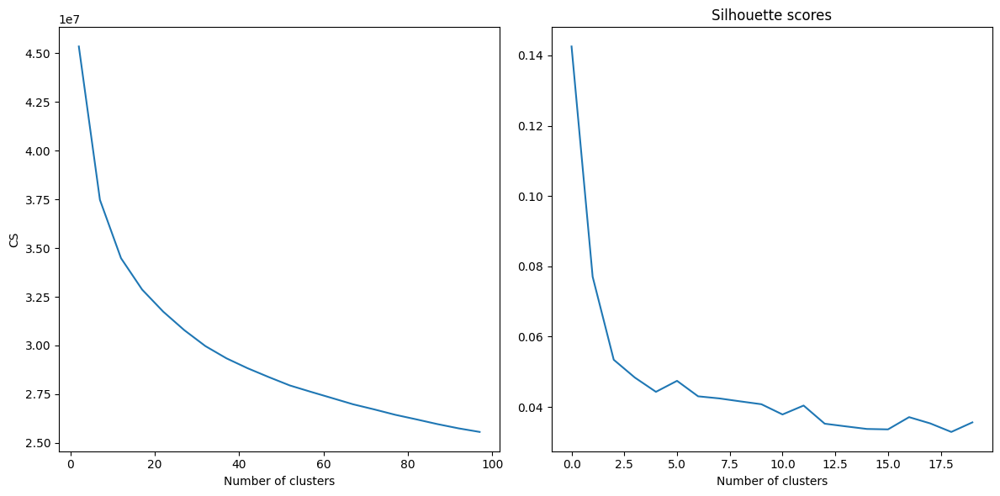

In [ ]:
k_means_tuning(data)

Function to apply the KMeans function and get the predicted clusters in return

In [ ]:
def apply_kmeans(k, data, filenames):
  # creating the prediction dataframe
  pred_df = pd.DataFrame(filenames, columns = ["filename"])

  # K-Means clustering
  clustering_kmeans = KMeans(n_clusters = k, init = 'k-means++', max_iter = 300, n_init = 10, random_state = RANDOM_SEED)

  pred_df["clusters"] = clustering_kmeans.fit_predict(data)

  return pred_df

# **5. Visualize images and cluster results**

In [ ]:
def plot_big_image(pred_df, num_images, shuffle = False):

    list_clusters = pred_df["clusters"].unique().tolist()
    list_clusters.sort()

    f, arr = plt.subplots(2 * len(list_clusters), num_images, figsize = (num_images * 4, 4 * len(list_clusters)))

    for j, num_cluster in enumerate(list_clusters):

        # taking only the rows with num_cluster
        images = pred_df[pred_df["clusters"] == num_cluster]

        # shuffling rows
        if shuffle: images = images.sample(frac=1)

        images = images[:num_images]

        list_img_path = images["filename"].tolist()

        for i, img_path in enumerate(list_img_path):

            list_img_path = img_path.split("/")
            palette_path = "/" + "/".join(list_img_path[1:])
            img_path = GDRIVE_DATA_DIR + "/" + list_img_path[-1]

            # Load the palette
            palette = Image.open(palette_path).resize((50, 10))
            try:
              img = Image.open(img_path) # first try with png
            except:
              try:
                img_path = img_path[:-4] + ".jpg" # then jpg
                img = Image.open(img_path)
              except:
                img_path = img_path[:-4] + ".jpeg" #then jpeg
                img = Image.open(img_path)

            # Plot the image
            arr[2*j, i].imshow(img)
            arr[2*j, i].axis('off')

            # Plot the color palette
            arr[2*j + 1, i].imshow(palette)
            arr[2*j + 1, i].axis('off')

    # Show the plot
    plt.show()

## **K = 23**

Since by the elbow method it appears that the optimal k it's 23, we try with it.

In [ ]:
pred_df = apply_kmeans(23, data, df["path"].tolist())

In [ ]:
pred_df["clusters"].value_counts()

17    667
11    543
7     539
16    498
9     476
13    463
14    457
12    402
3     376
8     320
15    303
1     287
20    279
21    277
5     271
0     271
6     268
4     262
18    245
10    244
19    200
2     170
22    150
Name: clusters, dtype: int64

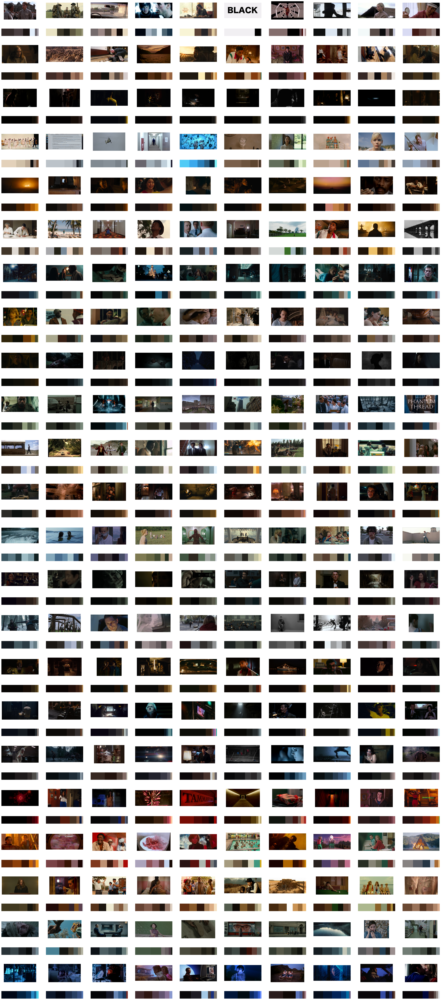

In [ ]:
plot_big_image(pred_df, 10, True)

## **t-SNE**

t-Distributed Stochastic Neighbor Embedding is a popular machine learning algorithm used for visualizing high-dimensional data in a lower-dimensional space.

In [ ]:
from sklearn.manifold import TSNE

def apply_tsne(data, pred_df):

    tSNE = TSNE(n_components=2)
    tSNE_result = tSNE.fit_transform(data)

    x = tSNE_result[:,0]
    y = tSNE_result[:,1]

    import pandas as pd
    import seaborn as sns

    colors = len(pd.unique(pred_df["clusters"]))

    df = pd.DataFrame(pred_df["clusters"])
    df['x']=x
    df['y']=y

    plt.figure(figsize=(16,7))
    sns.scatterplot(x='x',y='y',hue='clusters',palette=sns.color_palette("hls", colors),data=df,
                  legend="full")
    plt.show()

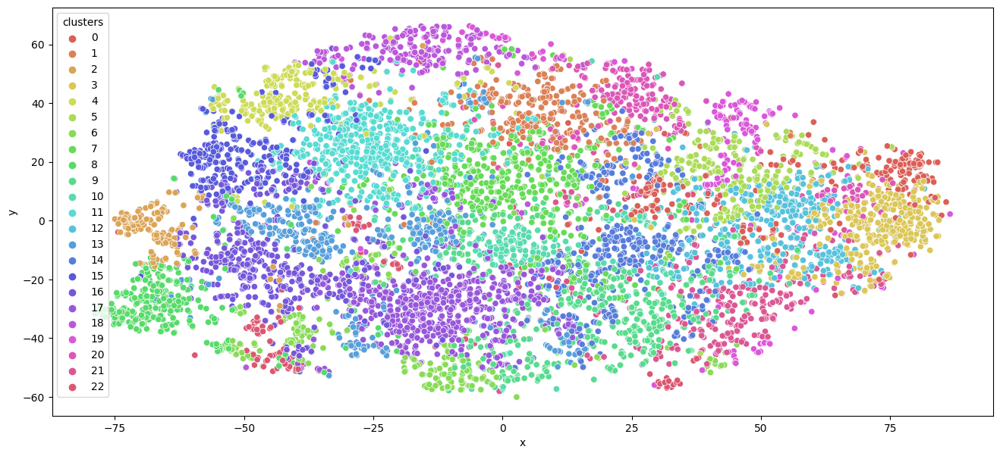

In [ ]:
apply_tsne(data, pred_df)

Save the clusters into

In [ ]:
num_clusters = len(pd.unique(pred_df["clusters"]))
pred_df.to_pickle(GDRIVE_HOME_DIR + f"/Big_Data/cluster_colors/K-Means/KMeans_k{num_clusters}.pkl")

## **K = 70**

Then we try also with k = 70, just to look at the results and comparing them

In [ ]:
pred_df_70 = apply_kmeans(70, data, df["path"].tolist())

In [ ]:
plot_big_image(pred_df_70, 5, True)

# **6. Conclusions**

When **k = 23** the selected images share similar palettes not so much in the hues of the colors present, but in the brightness, intensity, and percentage of color presence. For example, there is a cluster of desaturated colors but different hues **(1)**, a cluster of very vivid colors but different hues **(2)**, and a cluster of palettes with much contrast between the colors present **(3)**.

*(1) Desaturated*

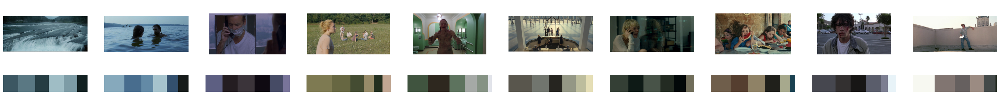

*(2) Vivid*

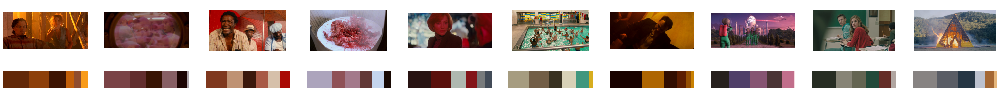

*(3) High contrast*

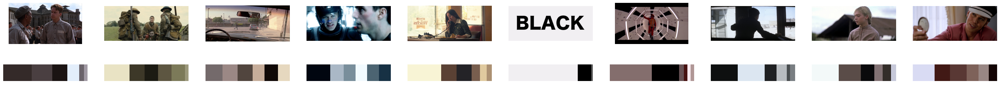

As the value of k increases (in the example we have **k = 70**), clusters also begin to be characterized by common hues: for example, there is a selection of predominantly red images **(4)**, a cluster in which a particular combination of blues and yellows is repeated **(5)**, a cluster of palettes with various shades of turquoise **(6)**.

*(4) Red*

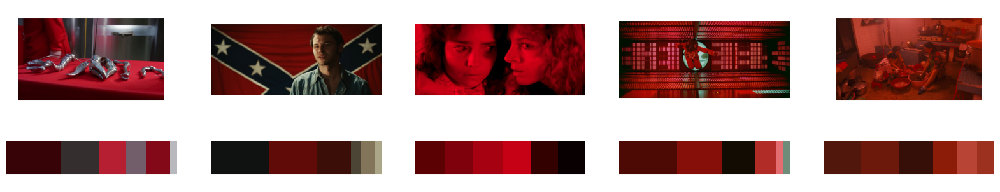

*(5) Blue and yellow*

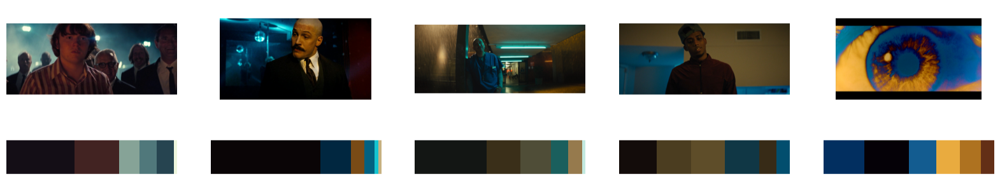

*(6) Shades of torquoise*

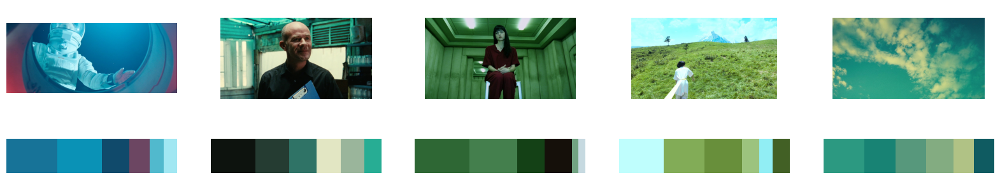